In [88]:
import pandas as pd
import matplotlib as mat
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
%matplotlib inline

pd.options.display.max_colwidth = 100

import random
import os

from numpy.random import seed
seed(42)

random.seed(42)
os.environ['PYTHONHASHSEED'] = str(42)
os.environ['TF_DETERMINISTIC_OPS'] = '1'

from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import accuracy_score

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import callbacks
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
import glob
import cv2

from tensorflow.random import set_seed
set_seed(42)

import warnings
warnings.filterwarnings('ignore')

In [32]:
# Set Matplotlib defaults
sns.set_style('darkgrid')
plt.rc("figure", autolayout=True)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=24,
    titlepad=10,
)

In [3]:
import os
import random
import shutil

In [4]:
print(os.listdir("../input"))

['bach-breast-cancer-histology-images']


In [5]:
MAIN_DIR = "/kaggle/input/bach-breast-cancer-histology-images/ICIAR2018_BACH_Challenge/ICIAR2018_BACH_Challenge/Photos"

In [6]:
MAIN = os.listdir(MAIN_DIR)
print(MAIN)

['InSitu', 'microscopy_ground_truth.csv', 'Benign', 'Normal', 'Invasive']


In [7]:
InSitu = "/kaggle/input/bach-breast-cancer-histology-images/ICIAR2018_BACH_Challenge/ICIAR2018_BACH_Challenge/Photos/InSitu"
Benign = "/kaggle/input/bach-breast-cancer-histology-images/ICIAR2018_BACH_Challenge/ICIAR2018_BACH_Challenge/Photos/Benign"
Normal = "/kaggle/input/bach-breast-cancer-histology-images/ICIAR2018_BACH_Challenge/ICIAR2018_BACH_Challenge/Photos/Normal"
Invasive = "/kaggle/input/bach-breast-cancer-histology-images/ICIAR2018_BACH_Challenge/ICIAR2018_BACH_Challenge/Photos/Invasive"

In [8]:
MAIN = os.listdir(InSitu)
print(MAIN)

['is062.tif', 'is095.tif', 'is045.tif', 'is083.tif', 'is008.tif', 'is070.tif', 'is065.tif', 'is058.tif', 'is037.tif', 'is100.tif', 'is093.tif', 'is036.tif', 'is019.tif', 'is030.tif', 'is002.tif', 'is079.tif', 'is059.tif', 'is039.tif', 'is033.tif', 'is024.tif', 'is097.tif', 'is084.tif', 'is080.tif', 'is054.tif', 'is060.tif', 'is017.tif', 'is086.tif', 'is075.tif', 'is071.tif', 'is016.tif', 'is063.tif', 'is088.tif', 'is023.tif', 'is004.tif', 'is056.tif', 'is076.tif', 'is013.tif', 'is090.tif', 'is067.tif', 'is081.tif', 'is068.tif', 'is018.tif', 'is098.tif', 'is052.tif', 'is027.tif', 'is041.tif', 'is005.tif', 'is043.tif', 'is077.tif', 'is087.tif', 'is096.tif', 'is057.tif', 'is003.tif', 'is064.tif', 'is040.tif', 'is031.tif', 'is038.tif', 'is074.tif', 'is015.tif', 'is044.tif', 'is012.tif', 'is011.tif', 'is047.tif', 'is053.tif', 'is028.tif', 'is049.tif', 'is006.tif', 'Thumbs.db', 'is082.tif', 'is048.tif', 'is078.tif', 'is001.tif', 'is025.tif', 'is061.tif', 'is035.tif', 'is066.tif', 'is010.tif'

In [9]:
insitu_list = []
for file in os.listdir(InSitu):
    # Check if the file is an image
    if file.endswith('tif'):
        # Add the file path to the list
        insitu_list.append(os.path.join(InSitu, file))

In [10]:
Benign_list = []
for file in os.listdir(Benign):
    # Check if the file is an image
    if file.endswith('tif'):
        # Add the file path to the list
        Benign_list.append(os.path.join(Benign, file))

In [11]:
Normal_list = []
for file in os.listdir(Normal):
    # Check if the file is an image
    if file.endswith('tif'):
        # Add the file path to the list
        Normal_list.append(os.path.join(Normal, file))

In [12]:
Invasive_list = []
for file in os.listdir(Invasive):
    # Check if the file is an image
    if file.endswith('tif'):
        # Add the file path to the list
        Invasive_list.append(os.path.join(Invasive, file))

In [13]:
insitu_df = pd.DataFrame(insitu_list, columns = ['image'])

In [56]:
insitu_df['label'] = 'Insitu'

In [15]:
Benign_df = pd.DataFrame(Benign_list, columns = ['image'])

In [57]:
Benign_df['label'] ='Benign'

In [17]:
Normal_df = pd.DataFrame(Normal_list, columns = ['image'])

In [58]:
Normal_df['label'] ='Normal'

In [19]:
Invasive_df = pd.DataFrame(Invasive_list, columns = ['image'])

In [59]:
Invasive_df['label'] ='Invasive'

In [61]:
df = pd.concat([insitu_df,Benign_df,Normal_df,Invasive_df], ignore_index=True)

In [62]:
class_count = df['label'].value_counts()
print(class_count)


label
Insitu      100
Benign      100
Normal      100
Invasive    100
Name: count, dtype: int64


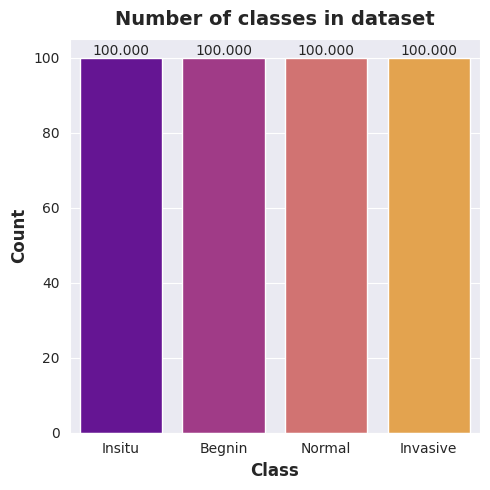

In [26]:
# Plot the results
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.barplot(x=class_count.index, y=class_count.values, palette = "plasma")
ax.bar_label(ax.containers[0], fmt='%.3f')
plt.title('Number of classes in dataset', fontsize=14)
plt.xlabel('Class', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(range(len(class_count.index)), ['Insitu','Begnin','Normal', 'Invasive'])
plt.show()

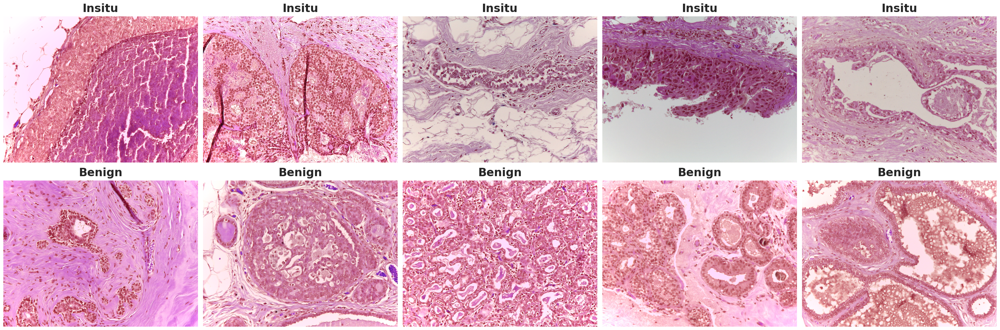

In [33]:
# Get few samples for both the classes
insitu_samples = (df[df['label']=='Insitu']['image'].iloc[:5]).tolist()
begnin_samples = (df[df['label']=='Benign']['image'].iloc[:5]).tolist()

# Concat the data in a single list and del the above two list
samples = insitu_samples + begnin_samples
del insitu_samples ,begnin_samples

# Plot the data
f, ax = plt.subplots(2,5, figsize=(30,10))
for i in range(10):
    img = cv2.imread(samples[i])
    ax[i//5, i%5].imshow(img)
    if i<5:
        ax[i//5, i%5].set_title("Insitu")
    else:
        ax[i//5, i%5].set_title("Benign")
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_aspect('auto')
plt.show()

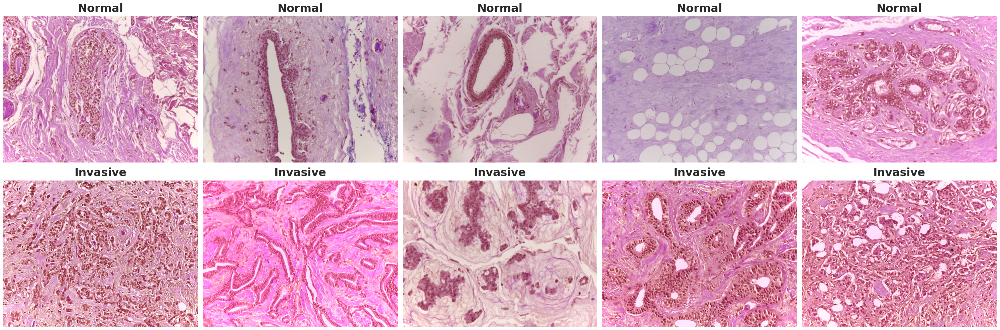

In [43]:
# Get few samples for both the classes
normal_samples = (df[df['label']=="Normal"]['image'].iloc[:5]).tolist()
invasive_samples = (df[df['label']=='Invasive']['image'].iloc[:5]).tolist()

# Concat the data in a single list and del the above two list
samples = normal_samples + invasive_samples
del normal_samples ,invasive_samples

# Plot the data
f, ax = plt.subplots(2,5, figsize=(30,10))
for i in range(10):
    img = cv2.imread(samples[i])
    ax[i//5, i%5].imshow(img)
    if i<5:
        ax[i//5, i%5].set_title("Normal")
    else:
        ax[i//5, i%5].set_title("Invasive")
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_aspect('auto')
plt.show()

In [63]:
from sklearn.model_selection import train_test_split
X_train, X_tmp = train_test_split(df, test_size=0.3, random_state=1,shuffle=True )

X_val, X_test = train_test_split(X_tmp, test_size=0.33, random_state=1,shuffle=True)

In [44]:
X_train['label'].value_counts()

label
1    77
0    71
3    67
2    65
Name: count, dtype: int64

In [45]:
X_val['label'].value_counts()

label
3    23
2    22
0    19
1    16
Name: count, dtype: int64

In [46]:
X_test['label'].value_counts()

label
2    13
3    10
0    10
1     7
Name: count, dtype: int64

In [47]:
IMG_SIZE = (int(1536*0.25), int(2048*0.25))
BATCH = 8
SEED = 42

In [52]:
import imageio

In [66]:
# https://vijayabhaskar96.medium.com/tutorial-on-keras-flow-from-dataframe-1fd4493d237c

train_datagen = ImageDataGenerator(rescale=1/255.,
                                  zoom_range = 0.2,
                                  horizontal_flip=True,
                                  vertical_flip=True)

val_datagen = ImageDataGenerator(rescale=1/255.)

ds_train = train_datagen.flow_from_dataframe(X_train,
                                             #directory=train_path, #dataframe contains the full paths
                                             x_col = 'image',
                                             y_col = 'label',
                                             class_mode="categorical",
                                             target_size = (IMG_SIZE),
                                             batch_size = BATCH,
                                             seed = SEED)

ds_val = val_datagen.flow_from_dataframe(X_val,
                                            #directory=train_path,
                                            x_col = 'image',
                                            y_col = 'label',
                                            class_mode="categorical",
                                            target_size = (IMG_SIZE),
                                            batch_size = BATCH,
                                            seed = SEED)

ds_test = val_datagen.flow_from_dataframe(X_test,
                                            #directory=test_path,
                                            x_col = 'image',
                                            y_col = 'label',
                                            class_mode="categorical",
                                            target_size = (IMG_SIZE),
                                            batch_size = 1,
                                            shuffle = False)

Found 280 validated image filenames belonging to 4 classes.
Found 80 validated image filenames belonging to 4 classes.
Found 40 validated image filenames belonging to 4 classes.


In [80]:
#Setting callbakcs

early_stopping = callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,
    min_delta=1e-7,
    restore_best_weights=True,
)

plateau = callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor = 0.2,
    patience = 2,
    min_delt = 1e-7,
    cooldown = 0,
    verbose = 1
)

In [108]:
def get_model():

    #Input shape = [width, height, color channels]
    inputs = layers.Input(shape=(224, 224, 3))

    # Block One
    x = layers.Conv2D(filters=16, kernel_size=3, padding='valid')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPool2D()(x)
    x = layers.Dropout(0.2)(x)

    # Block Two
    x = layers.Conv2D(filters=32, kernel_size=3, padding='valid')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPool2D()(x)
    x = layers.Dropout(0.2)(x)

    # Block Three
    x = layers.Conv2D(filters=64, kernel_size=3, padding='valid')(x)
    x = layers.Conv2D(filters=64, kernel_size=3, padding='valid')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPool2D()(x)
    x = layers.Dropout(0.4)(x)

    # Head
    #x = layers.BatchNormalization()(x)
    x = layers.Flatten()(x)
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.5)(x)

    #Final Layer (Output)
    output = layers.Dense(4, activation='sigmoid')(x)

    model = keras.Model(inputs=[inputs], outputs=output)

    return model

In [109]:
keras.backend.clear_session()

model = get_model()
model.compile(optimizer="adamax", loss="categorical_crossentropy", metrics=['accuracy'])
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 222, 222, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 222, 222, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 222, 222, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 111, 111, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 109, 109, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 109, 109, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 54, 54, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 50, 50, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 50, 50, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 50, 50, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 25, 25, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 25, 25, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 40000)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │     2,560,064 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,621,284 (10.00 MB)

 Trainable params: 2,621,060 (10.00 MB)

 Non-trainable params: 224 (896.00 B)

In [110]:
history = model.fit(ds_train,
          batch_size = BATCH, epochs = 50,
          validation_data=ds_val,
          callbacks=[early_stopping, plateau])

Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.1743 - loss: 26.1218 - val_accuracy: 0.2000 - val_loss: 1.3905 - learning_rate: 0.0010
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - accuracy: 0.2632 - loss: 1.4273 - val_accuracy: 0.2000 - val_loss: 1.3866 - learning_rate: 0.0010
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.2812 - loss: 1.3897 - val_accuracy: 0.2000 - val_loss: 1.3866 - learning_rate: 0.0010
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.3243 - loss: 1.3576
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
9/9 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.3208 - loss: 1.3579 - val_accuracy: 0.2000 - val_loss: 1.3867 - learning_rate: 0.0010
Epoch 5/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - accuracy: 0.3290 - loss: 1.3600 - val_accuracy: 0.2000 - val_loss: 1.3867 - learning_rate: 2.0000e-04
